In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Import libraries


In [ ]:
!pip install pyLDAvis # Topic Modeling
!pip install pytextrank==2.0.2 # Extract Keywords
!pip install -U pip setuptools wheel
!pip install -U spacy
!python -m spacy download en_core_web_sm
!pip install rake-nltk
!pip install python-rake

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from nltk.stem import WordNetLemmatizer,PorterStemmer
from sklearn.cluster import DBSCAN
from nltk.corpus import stopwords
from spacy.matcher import Matcher 
import matplotlib.pyplot as plt
from spacy.tokens import Span 
import tensorflow_hub as hub
from rake_nltk import Rake
import pytextrank
import nltk
import tensorflow as tf
import pyLDAvis.gensim_models
from tqdm import tqdm
import seaborn as sns
import networkx as nx
import pandas as pd
import numpy as np
import pyLDAvis
import gensim
import spacy
import os
import gc
import re
import logging
import sys

### Find Similar Articles For Specific-Target 
#### Search for easy KG 


In [ ]:
path = "/content/gdrive/MyDrive/Project2-KG"

In [ ]:
module_url = path + "/model/universalsentenceencoderlarge4" 
# Import the Universal Sentence Encoder's TF Hub module
embed = hub.load(module_url)

In [ ]:
all_sources = pd.read_csv(path + "/input/CORD-19-research-challenge/metadata.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1,4,5,6,13,14,15,16) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
all_sources.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 579255 entries, 0 to 579254
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   cord_uid          579255 non-null  object 
 1   sha               193890 non-null  object 
 2   source_x          579255 non-null  object 
 3   title             578966 non-null  object 
 4   doi               311662 non-null  object 
 5   pmcid             202603 non-null  object 
 6   pubmed_id         269153 non-null  object 
 7   license           579255 non-null  object 
 8   abstract          423055 non-null  object 
 9   publish_time      579036 non-null  object 
 10  authors           563977 non-null  object 
 11  journal           541087 non-null  object 
 12  mag_id            0 non-null       float64
 13  who_covidence_id  247058 non-null  object 
 14  arxiv_id          7597 non-null    object 
 15  pdf_json_files    193890 non-null  object 
 16  pmc_json_files    15

In [ ]:
all_sources.head(2)

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,mag_id,who_covidence_id,arxiv_id,pdf_json_files,pmc_json_files,url,s2_id
0,ug7v899j,d1aafb70c066a2068b02786f8929fd9c900897fb,PMC,Clinical features of culture-proven Mycoplasma...,10.1186/1471-2334-1-6,PMC35282,11472636,no-cc,OBJECTIVE: This retrospective chart review des...,2001-07-04,"Madani, Tariq A; Al-Ghamdi, Aisha A",BMC Infect Dis,NaN,NaN,NaN,document_parses/pdf_json/d1aafb70c066a2068b027...,document_parses/pmc_json/PMC35282.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3...,NaN
1,02tnwd4m,6b0567729c2143a66d737eb0a2f63f2dce2e5a7d,PMC,Nitric oxide: a pro-inflammatory mediator in l...,10.1186/rr14,PMC59543,11667967,no-cc,Inflammatory diseases of the respiratory tract...,2000-08-15,"Vliet, Albert van der; Eiserich, Jason P; Cros...",Respir Res,NaN,NaN,NaN,document_parses/pdf_json/6b0567729c2143a66d737...,document_parses/pmc_json/PMC59543.xml.json,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5...,NaN


In [ ]:
all_sources['title'][2]

'Surfactant protein-D and pulmonary host defense'

# *1*. Use Universal Sentence Encoder




In [ ]:
def prepare_similarity(vectors):
    similarity = cosine_similarity(vectors)
    return similarity

In [ ]:
def get_top_similar(sentence, sentence_list, similarity_matrix, topN):
    # find the index of sentence in list
    index = sentence_list.index(sentence)
    # get the corresponding row in similarity matrix
    similarity_row = np.array(similarity_matrix[index, :])
    # get the indices of top similar
    indices = similarity_row.argsort()[-topN:][::-1]
    return [(i,sentence_list[i]) for i in indices]

In [ ]:
titles = all_sources['title'].fillna("Unknown") # Use Unknown for Na values of title.
embed_vectors = embed(titles[:100].values)['outputs'].numpy() # 100 first rows for test. 
sentence_list = titles.values.tolist()
sentence = titles.iloc[5]
print("Find similar research papers for :")
print(sentence)

Find similar research papers for :
Sequence requirements for RNA strand transfer during nidovirus discontinuous subgenomic RNA synthesis


In [ ]:
similarity_matrix = prepare_similarity(embed_vectors)
similar = get_top_similar(sentence,sentence_list,similarity_matrix,6) # Top 6 titles best similar. 

In [ ]:
for title in similar:
  print(title[1])

Sequence requirements for RNA strand transfer during nidovirus discontinuous subgenomic RNA synthesis
Role of RNA helicases in HIV-1 replication
A universal BMV-based RNA recombination system—how to search for general rules in RNA recombination
Heterogeneous nuclear ribonucleoprotein A1 regulates RNA synthesis of a cytoplasmic virus
Delivery Systems for the Direct Application of siRNAs to Induce RNA Interference (RNAi) In Vivo
Bioinformatic mapping of AlkB homology domains in viruses


In [ ]:
del embed_vectors,sentence_list,similarity_matrix
gc.collect()

247

# Use DBSCAN FOR CLUSTER

In [ ]:
nlp = spacy.load('en_core_web_sm')
sent_vecs={}
docs=[]

for i in tqdm(all_sources['title'].fillna('unknown')[:1000]): # Cluster for 1000 first articles.
    doc = nlp((i)) 
    docs.append(doc)
    sent_vecs.update({i :doc.vector})



100%|██████████| 1000/1000 [00:08<00:00, 113.55it/s]


In [ ]:
sentences=list(sent_vecs.keys())
vectors=list(sent_vecs.values())

In [ ]:
vectors[0:1][0].shape 

(96,)

In [ ]:
sentences[0:10]

['Clinical features of culture-proven Mycoplasma pneumoniae infections at King Abdulaziz University Hospital, Jeddah, Saudi Arabia',
 'Nitric oxide: a pro-inflammatory mediator in lung disease?',
 'Surfactant protein-D and pulmonary host defense',
 'Role of endothelin-1 in lung disease',
 'Gene expression in epithelial cells in response to pneumovirus infection',
 'Sequence requirements for RNA strand transfer during nidovirus discontinuous subgenomic RNA synthesis',
 'Debate: Transfusing to normal haemoglobin levels will not improve outcome',
 'The 21st International Symposium on Intensive Care and Emergency Medicine, Brussels, Belgium, 20-23 March 2001',
 'Heme oxygenase-1 and carbon monoxide in pulmonary medicine',
 'Technical Description of RODS: A Real-time Public Health Surveillance System']

In [ ]:
x = np.array(vectors)
dbscan=DBSCAN(eps=0.08, min_samples=2,metric='cosine' ).fit(x)
df_cluster=pd.DataFrame({'sentences':sentences,'label':dbscan.labels_})

In [ ]:
df_cluster.nunique()

sentences    998
label         10
dtype: int64

In [ ]:
df_cluster[(df_cluster['label']==2)]

,sentences,label
257,Evidence of Recombination and Genetic Diversit...,2
541,Genomic Characterization and High Prevalence o...,2


In [ ]:
df_cluster[(df_cluster['label']==5)].head()

,sentences,label
430,Predictive Power of Air Travel and Socio-Econo...,5
458,Antiviral and Neuroprotective Role of Octaguan...,5


## Work for cleaned data

In [ ]:
path += '/input/cord-19-eda-parse-json-and-generate-clean-csv'

In [ ]:
clean_comm = pd.read_csv(path + "/clean_comm_use.csv", nrows = 5000) # Commercial licences

In [ ]:
clean_comm['source']='clean_comm'

In [ ]:
# Limited RAM
# clean_pmc = pd.read_csv(path + "/clean_pmc.csv", nrows = 5000) # Custom Licences 
# clean_pmc['source'] = 'clean_pmc' 

In [ ]:
biox = pd.read_csv(path + "/biorxiv_clean.csv")
biox['source']='biorx'

In [ ]:
all_articles=pd.concat([biox, clean_comm])

In [ ]:
del biox,clean_comm
gc.collect()

1835

In [ ]:
all_articles.shape

(6625, 10)

In [ ]:
# Defind task for search data
tasks=["What is known about transmission, incubation, and environmental stability",
      "What do we know about COVID-19 risk factors",
      "What do we know about virus genetics, origin, and evolution",
      "What do we know about vaccines and therapeutics",
      "What do we know about non-pharmaceutical interventions",
      "What do we know about diagnostics and surveillance",
      "What has been published about ethical and social science considerations",
      "Role of the environment in transmission",
      "Range of incubation periods for the disease in humans",
      "Prevalence of asymptomatic shedding and transmission",
      "Seasonality of transmission",
      "Persistence of virus on surfaces of different materials (e,g., copper, stainless steel, plastic)",
      "Susceptibility of populations",
      "Public health mitigation measures that could be effective for control",
      "Transmission dynamics of the virus",
      "Evidence that livestock could be infected",
      "Socioeconomic and behavioral risk factors for this spill-over",
      "Sustainable risk reduction strategies",
      "Resources to support skilled nursing facilities and long term care facilities",
      "Mobilization of surge medical staff to address shortages in overwhelmed communities"]

In [ ]:
task_df=pd.DataFrame({'title':tasks,'source':'task'})

In [ ]:
task_df.head()

,title,source
0,"What is known about transmission, incubation, and environmental stability",task
1,What do we know about COVID-19 risk factors,task
2,"What do we know about virus genetics, origin, and evolution",task
3,What do we know about vaccines and therapeutics,task
4,What do we know about non-pharmaceutical interventions,task


In [ ]:
all_articles = pd.concat([all_articles,task_df]) # Add tasks into df to search similar for existing.
all_articles.fillna("Unknown",inplace=True)

In [ ]:
all_articles.tail(5)

,paper_id,title,authors,affiliations,abstract,text,bibliography,raw_authors,raw_bibliography,source
15,Unknown,Evidence that livestock could be infected,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,task
16,Unknown,Socioeconomic and behavioral risk factors for ...,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,task
17,Unknown,Sustainable risk reduction strategies,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,task
18,Unknown,Resources to support skilled nursing facilitie...,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,task
19,Unknown,Mobilization of surge medical staff to address...,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,task


In [ ]:
all_articles['title'].unique().shape

(6332,)

In [ ]:
sentence_list = all_articles.title.values.tolist()
embed_vectors1 = embed(sentence_list[:2000])['outputs'].numpy()
embed_vectors2 = embed(sentence_list[2000:4000])['outputs'].numpy()

In [ ]:
embed_vectors3=embed(sentence_list[4000:6000])['outputs'].numpy()
embed_vectors4=embed(sentence_list[6000:])['outputs'].numpy()

In [ ]:
embed_vectors = np.concatenate((embed_vectors1, embed_vectors2, embed_vectors3, embed_vectors4), axis=0)
similarity_matrix = prepare_similarity(embed_vectors)

In [ ]:
"Role of the environment in transmission" in sentence_list

True

In [ ]:
sentence= "Role of the environment in transmission"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,10)

In [ ]:
for sent in similar:
    print(sent[0], sent[1])

6632 Role of the environment in transmission
2339 Aerobiology and Its Role in the Transmission of Infectious Diseases
1621 Effects of temperature on COVID-19 transmission
6625 What is known about transmission, incubation, and environmental stability
429 The role of absolute humidity on transmission rates of the COVID-19 outbreak
6639 Transmission dynamics of the virus
450 Temperature dependence of COVID-19 transmission
38 Roles of meteorological conditions in COVID-19 transmission on a worldwide scale
3509 Role of Oct4 in the early embryo development
4069 Role of fomites in SARS transmission during the largest hospital outbreak in Hong Kong


In [ ]:
ind,title=list(map(list,zip(*similar)))

titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])
    # texts.append(all_articles.iloc[i]['title'] + all_articles.iloc[i]['abstract']) # === IF USE neuralcoref can improve deteminmer in abtract relate to 'title'. 

In [ ]:
def clean(txt):
    txt=re.sub(r'\n','',txt)
    txt=txt.replace('Abstract', "")
    txt=txt.replace('Unknown', "")
    txt=re.sub(r'\([^()]*\)','',txt)
    txt=re.sub(r'https?:\S+\sdoi','',txt)
    return txt

In [ ]:
texts=list(map(clean, texts))
text_list=' '.join(texts)
# text_list=word_tokenize(text_list)

In [ ]:
text_list

" Aerobiology plays a fundamental role in the transmission of infectious diseases. As infectious disease and infection control practitioners continue employing contemporary techniques , the central variables affecting the airborne transmission of pathogens are becoming better known. \ue062is paper reviews many of these aerobiological variables , as well as the common origins of these infectious particles. We then review several real-world settings with known difficulties controlling the airborne transmission of infectious particles , while detailing the respective measures each of these industries is undertaking in its effort to ameliorate the transmission of airborne infectious diseases. Coronavirus disease 2019 is an infectious disease caused by severe acute respiratory syndrome coronavirus 2 , it was first identified in 2019 in Wuhan, China and has resulted in the 2019-20 coronavirus pandemic. As of March 1, 2020, 79,968 patients in China and 7169 outside of China had tested positiv

In [ ]:
all_articles[all_articles['title'] == 'Role of the environment in transmission']

,paper_id,title,authors,affiliations,abstract,text,bibliography,raw_authors,raw_bibliography,source
7,Unknown,Role of the environment in transmission,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,task


## Keyword Extraction 

1. RAKE

In [ ]:
# Reka
import RAKE
import operator

# Reka setup with stopword directory
path = "/content/gdrive/MyDrive/Project2-KG/"
stop_dir = path + "/input/stopwordsforrake/SmartStoplist.txt"
rake_object = RAKE.Rake(stop_dir)

# Sample text to test RAKE


# Extract keywords
keywords = rake_object.run(text_list)

In [ ]:
words, score=list(map(list, zip(*keywords)))
for word in (words[:10]):
    print(word)

detailed mechanism-based investigation
droplet-mediated viral diseases
severe acute respiratory syndrome
complete full-term development
combined long-range airborne
maternal oct4-depleted embryos
long-range airborne
findings give hope
caused great damage
confirmed case counts


2. Pytextrank

In [ ]:
logging.basicConfig(stream=sys.stdout, level=logging.DEBUG)
logger = logging.getLogger("PyTR")

# add PyTextRank into the spaCy pipeline

from spacy.language import Language
@Language.component("textrank")
def textrank(doc):
    tr = pytextrank.TextRank()
    doc = tr.PipelineComponent(doc)
    return doc
nlp.add_pipe("textrank", last=True)
# parse the document

doc = nlp(text_list)

print("pipeline", nlp.pipe_names)
print("elapsed time: {} ms".format(tr.elapsed_time))

ValueError: ignored

In [ ]:
for phrase in doc._.phrases[:10]:
    print("{}".format(phrase.text))
    #print(phrase.chunks)

# KNOWLEDGE GRAPH

## Use 'title' to search similar and 'abstract' to extract KG

In [ ]:
def get_entities(sent):
  ## chunk 1
  ent1 = ""
  ent2 = ""

  prv_tok_dep = ""    # dependency tag of previous token in the sentence
  prv_tok_text = ""   # previous token in the sentence

  prefix = ""
  modifier = ""

  #############################################################
  
  for tok in nlp(sent):
    ## chunk 2
    # if token is a punctuation mark then move on to the next token
    if tok.dep_ != "punct":
      # check: token is a compound word or not
      if tok.dep_ == "compound":
        prefix = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          prefix = prv_tok_text + " "+ tok.text
      
      # check: token is a modifier or not
      if tok.dep_.endswith("mod") == True:
        modifier = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          modifier = prv_tok_text + " "+ tok.text
      
      ## chunk 3
      if tok.dep_.find("subj") == True:
        ent1 = modifier +" "+ prefix + " "+ tok.text
        prefix = ""
        modifier = ""
        prv_tok_dep = ""
        prv_tok_text = ""      

      ## chunk 4
      if tok.dep_.find("obj") == True:
        ent2 = modifier +" "+ prefix +" "+ tok.text
        
      ## chunk 5  
      # update variables
      prv_tok_dep = tok.dep_
      prv_tok_text = tok.text
  #############################################################

  return [ent1.strip(), ent2.strip()]

In [ ]:
def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [[{'DEP': "aux",'OP':"?"}, 
              {'DEP':'ROOT'}, 
              {'DEP':'prep','OP':"?"}, 
              {'DEP':'agent','OP':"?"}, 
             {'POS':'ADJ','OP':"?"}]] 

  matcher.add("matching_1", pattern) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)

In [ ]:
def prepare_df(text_list):
    doc=nlp(text_list)
    df=pd.DataFrame()
    for sent in list(doc.sents):
        sub,obj = get_entities(str(sent))
        lem = WordNetLemmatizer()
        relation= get_relation(str(sent))

        if ((len(relation)>2) & (len(sub)>2) &(len(obj)>2)):
            df=df.append({'subject':sub,'relation':relation,'object':obj},ignore_index=True)

    return df

In [ ]:
test = nlp('ogy plays a fundamental role in the transmission of infectious diseases')
for tok in test:
  print(tok.text, '=--=', tok.dep_)

ogy =--= nsubj
plays =--= ROOT
a =--= det
fundamental =--= amod
role =--= dobj
in =--= prep
the =--= det
transmission =--= pobj
of =--= prep
infectious =--= amod
diseases =--= pobj


In [ ]:
from spacy import displacy

In [ ]:
displacy.render(test, style="dep" , jupyter=True)

In [ ]:
df = prepare_df(text_list)
df.head()

,object,relation,subject
0,infectious diseases,plays,Aerobiology
1,airborne pathogens,becoming,central infection control variables
2,infectious diseases,review several,respective world each
3,2019 coronavirus pandemic,identified in,2 syndrome it
4,Chinese patients,tested positive,mortality rate


In [ ]:
def draw_kg(pairs,c1='red',c2='blue',c3='orange'):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
  
    node_deg = nx.degree(k_graph)
    layout = nx.spring_layout(k_graph, k=0.15, iterations=20)
    plt.figure(num=None, figsize=(50, 40), dpi=80)
    nx.draw_networkx(
        k_graph,
        node_size=[int(deg[1]) * 1000 for deg in node_deg],
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color=c1,
        edgecolors=c2,
        node_color=c3,
        )
    labels = dict(zip(list(zip(pairs.subject, pairs.object)),
                  pairs['relation'].tolist()))
    nx.draw_networkx_edge_labels(k_graph, pos=layout, edge_labels=labels,
                                 font_color='red')
    plt.axis('off')
    plt.show()

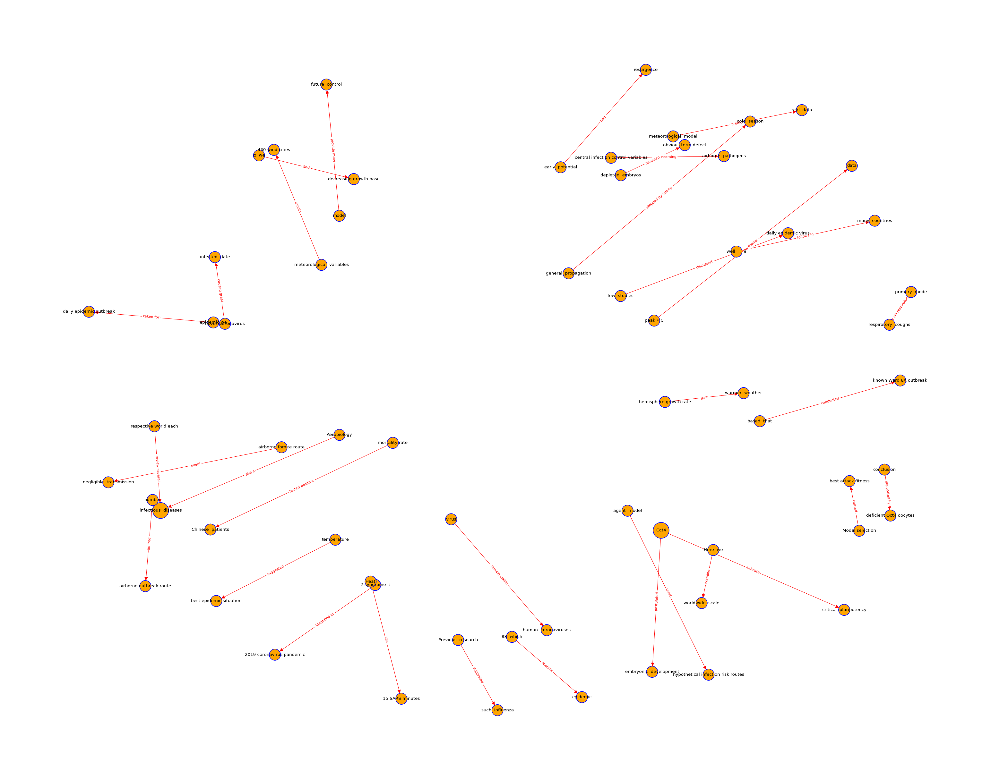

In [ ]:
draw_kg(df)

In [ ]:
df.to_csv(path + '/input/out1.csv', index=False)  

In [ ]:
text_list

" Aerobiology plays a fundamental role in the transmission of infectious diseases. As infectious disease and infection control practitioners continue employing contemporary techniques , the central variables affecting the airborne transmission of pathogens are becoming better known. \ue062is paper reviews many of these aerobiological variables , as well as the common origins of these infectious particles. We then review several real-world settings with known difficulties controlling the airborne transmission of infectious particles , while detailing the respective measures each of these industries is undertaking in its effort to ameliorate the transmission of airborne infectious diseases. Coronavirus disease 2019 is an infectious disease caused by severe acute respiratory syndrome coronavirus 2 , it was first identified in 2019 in Wuhan, China and has resulted in the 2019-20 coronavirus pandemic. As of March 1, 2020, 79,968 patients in China and 7169 outside of China had tested positiv


What is known about transmission, incubation, and environmental stability? ¶


In [ ]:
sentence= "What is known about transmission, incubation, and environmental stability"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

In [ ]:
ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

In [ ]:
texts=list(map(clean,texts))
text_list=' '.join(texts)

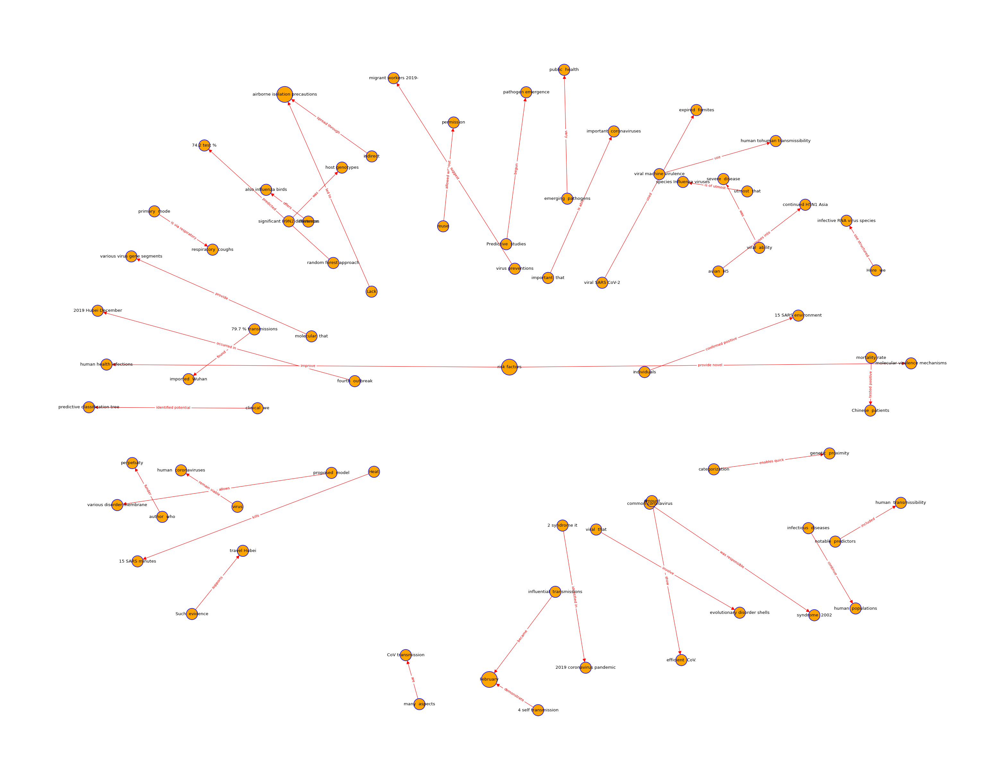

In [ ]:
df = prepare_df(text_list)
draw_kg(df)

In [ ]:
df.to_csv(path + '/input/out2.csv', index=False)  

What do we know about COVID-19 risk factors?

In [ ]:
sentence= "What do we know about COVID-19 risk factors"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,50)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out3.csv', index=False)  

Output hidden; open in https://colab.research.google.com to view.

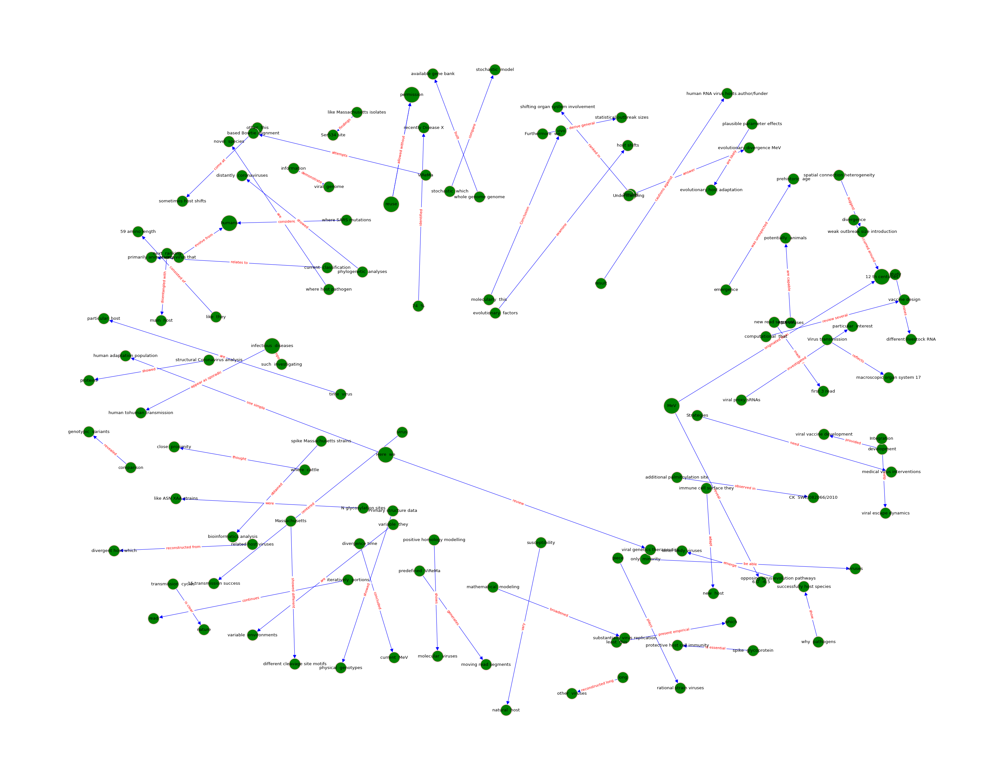

In [ ]:
sentence= "What do we know about virus genetics, origin, and evolution"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out4.csv', index=False)  

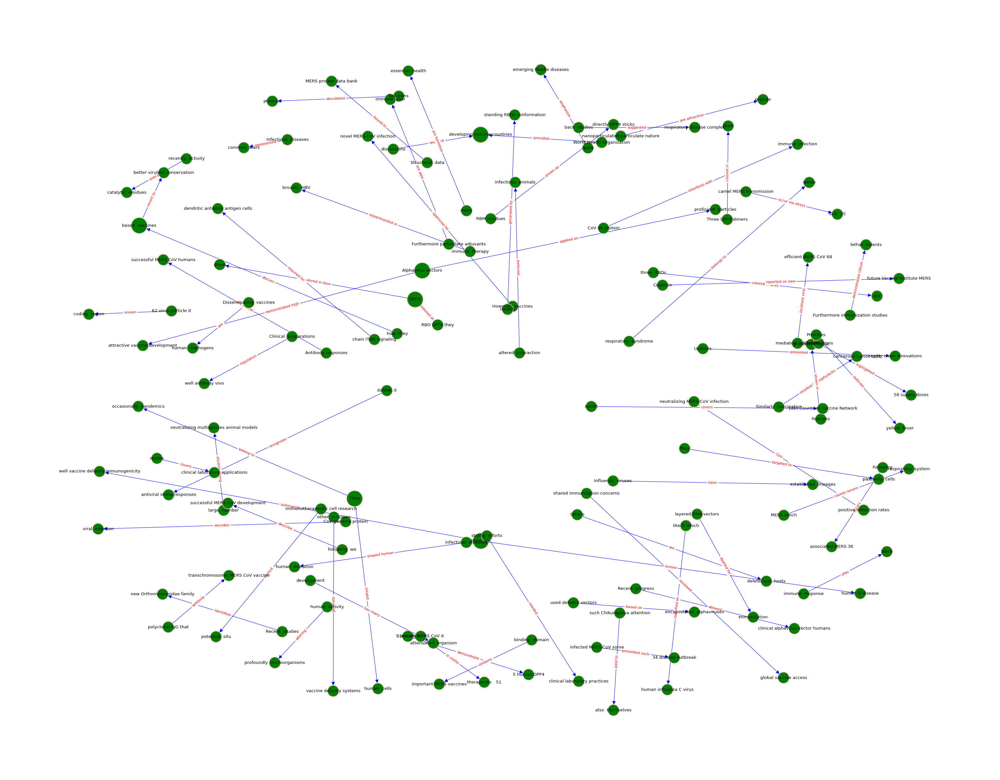

In [ ]:
sentence= "What do we know about vaccines and therapeutics"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out5.csv', index=False)  

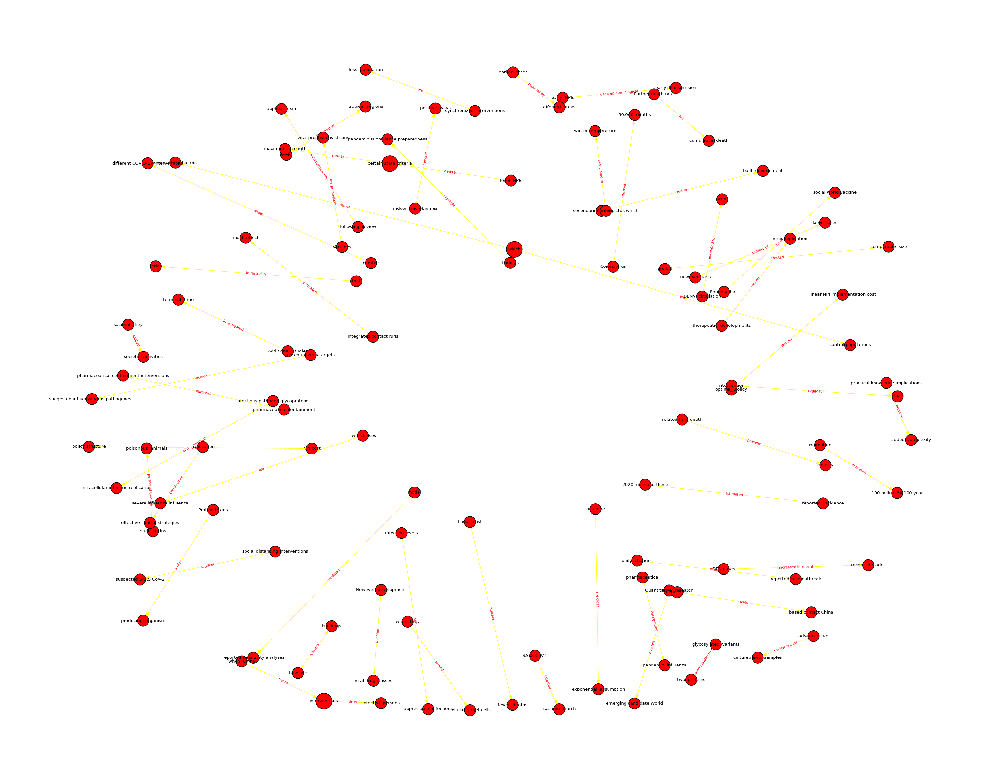

In [ ]:
sentence= "What do we know about non-pharmaceutical interventions"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='yellow',c2='black',c3='red')
df.to_csv(path + '/input/out6.csv', index=False)  

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 65306 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 65306 missing from current font.
  font.set_text(s, 0, flags=flags)


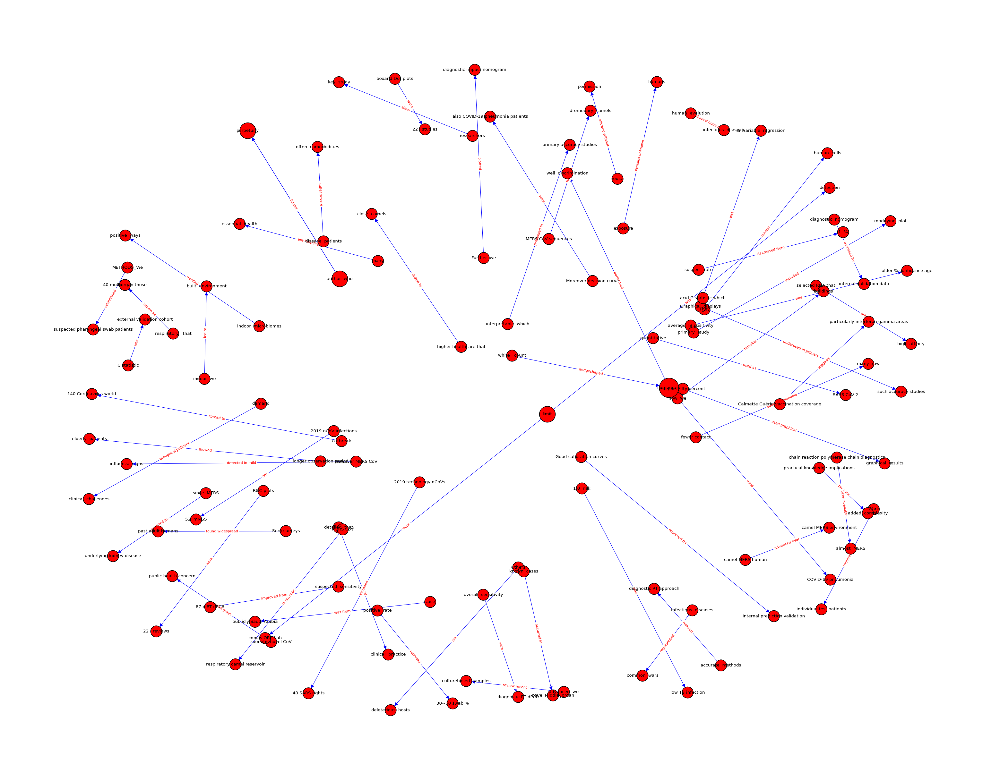

In [ ]:
sentence= "What do we know about diagnostics and surveillance"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='black',c3='red')
df.to_csv(path + '/input/out7.csv', index=False)  

what has been published about ethical and social science considerations

In [ ]:
sentence= "What has been published about ethical and social science considerations"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,50)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='black',c3='red')
df.to_csv(path + '/input/out8.csv', index=False)  

Output hidden; open in https://colab.research.google.com to view.

Role of the environment in transmission

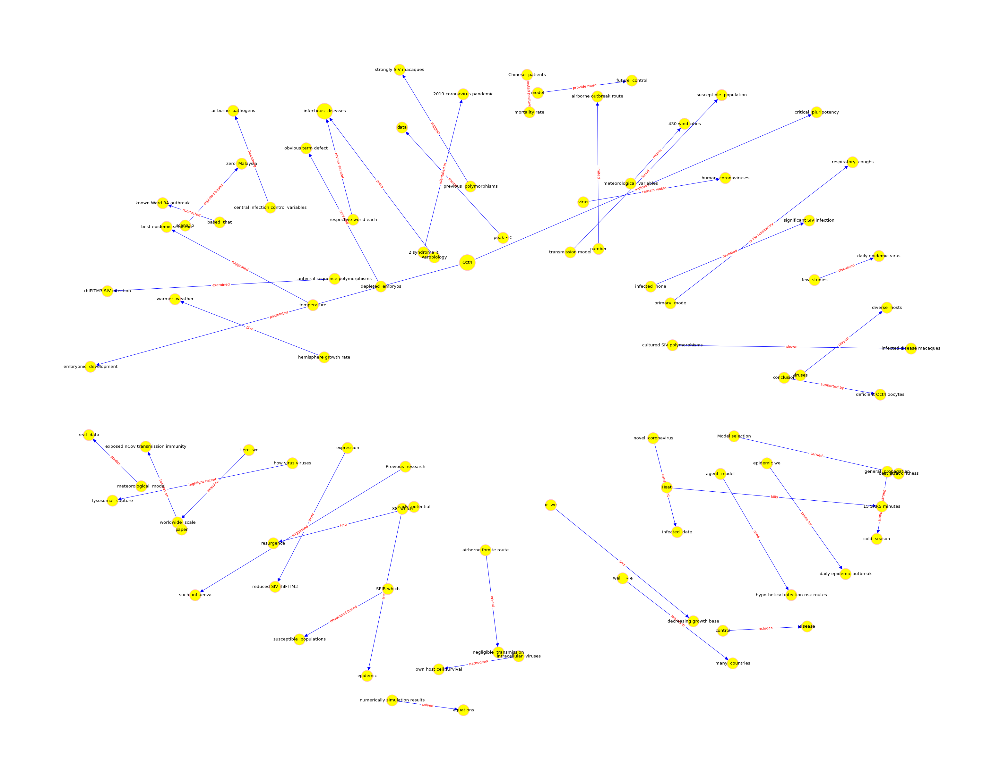

In [ ]:
sentence= "Role of the environment in transmission"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='yellow')
df.to_csv(path + '/input/out9.csv', index=False)  

Range of incubation periods for the disease in humans

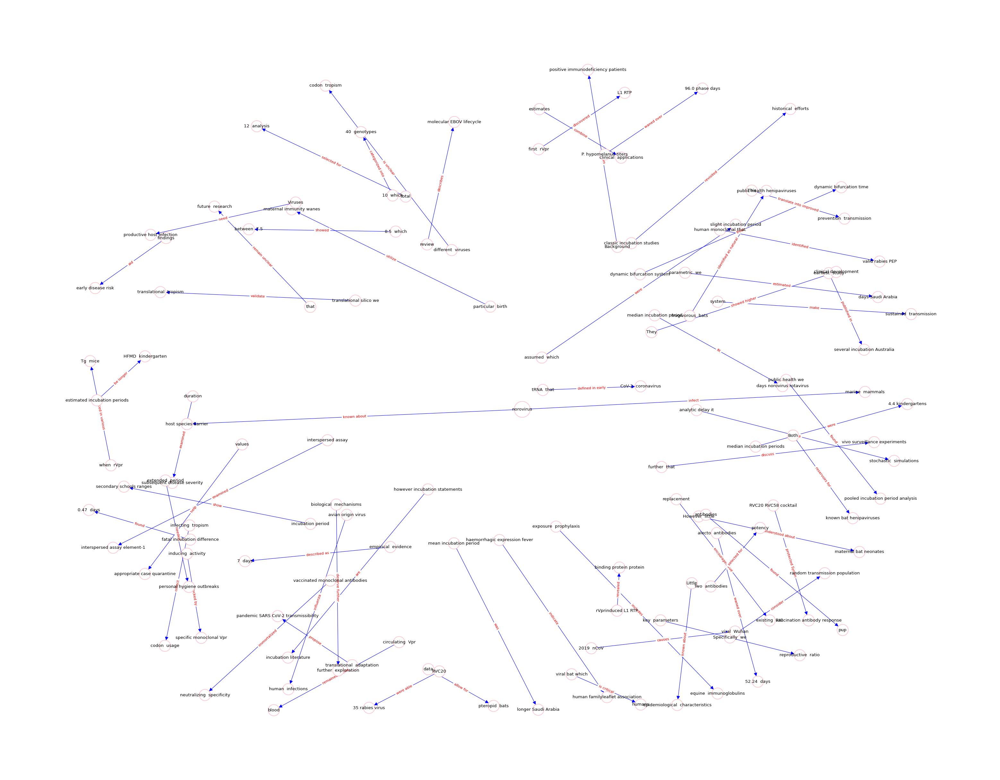

In [ ]:
sentence= "Range of incubation periods for the disease in humans"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='white')
df.to_csv(path + '/input/out10.csv', index=False) 

Prevalence of asymptomatic shedding and transmission?

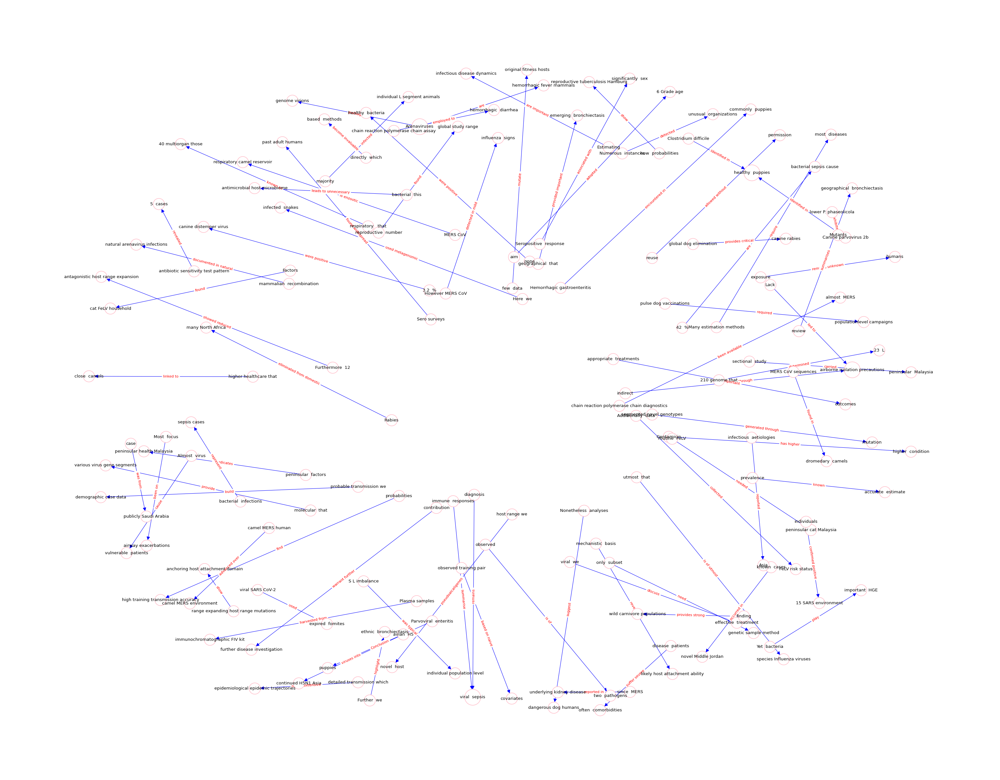

In [ ]:
sentence= "Prevalence of asymptomatic shedding and transmission"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='white')
df.to_csv(path + '/input/out11.csv', index=False) 

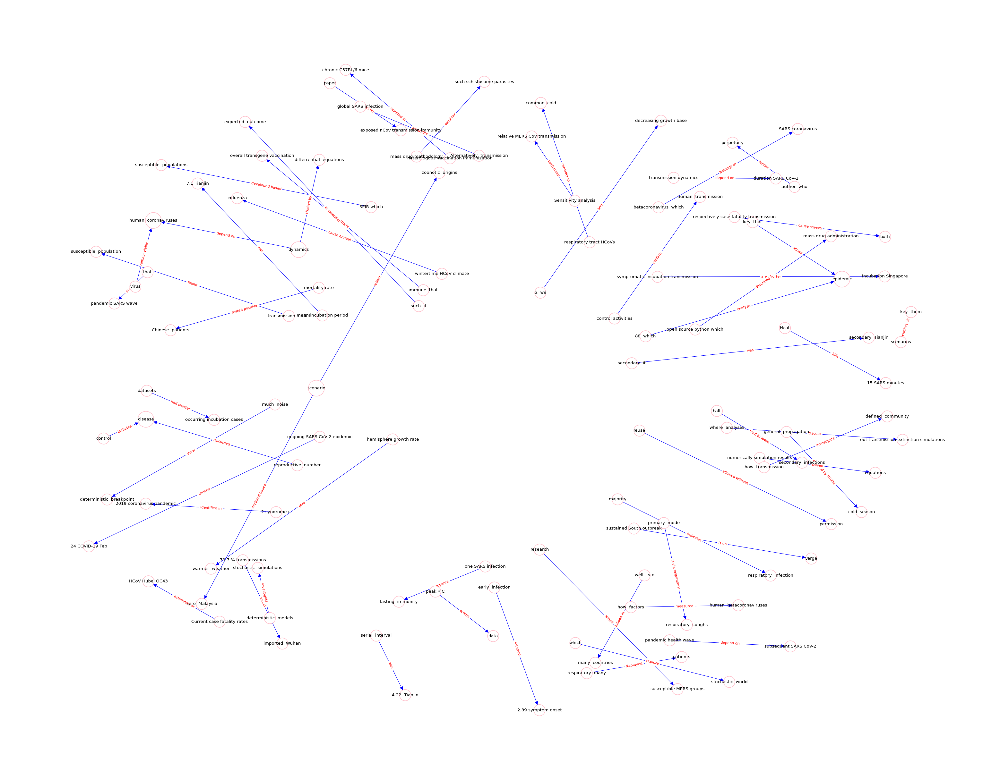

In [ ]:
sentence= "Seasonality of transmission"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='white')
df.to_csv(path + '/input/out12.csv', index=False) 

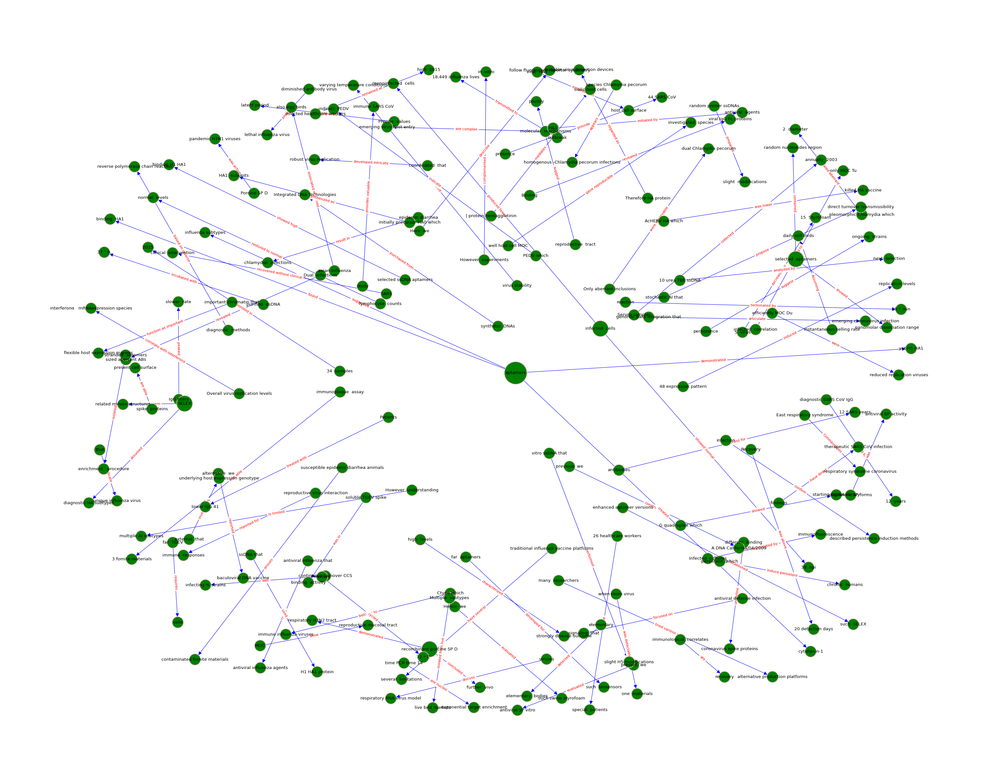

In [ ]:
sentence= "Persistence of virus on surfaces of different materials (e,g., copper, stainless steel, plastic)"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out13.csv', index=False) 

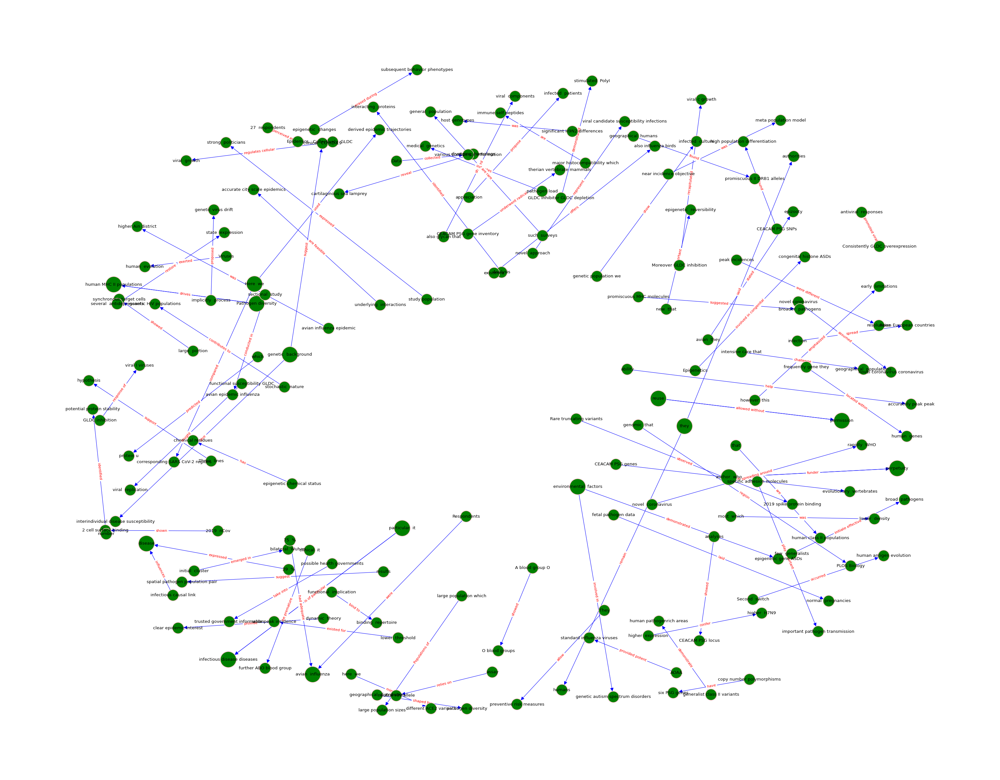

In [ ]:
sentence= "Susceptibility of populations"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out14.csv', index=False) 

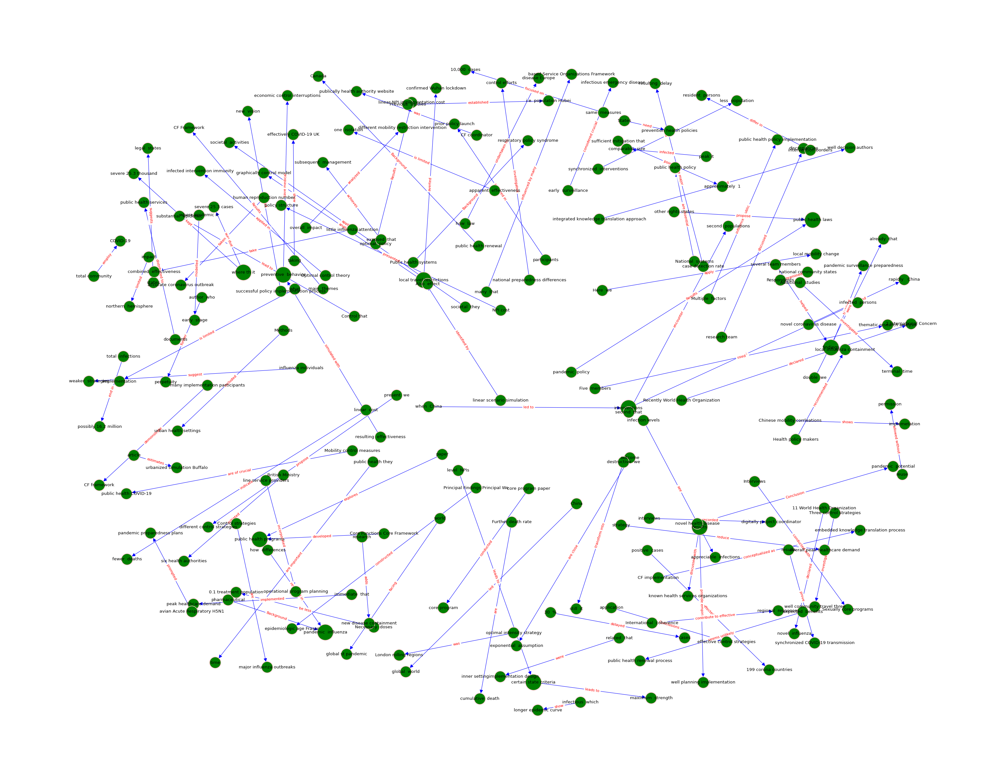

In [ ]:
sentence= "Public health mitigation measures that could be effective for control"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out15.csv', index=False) 

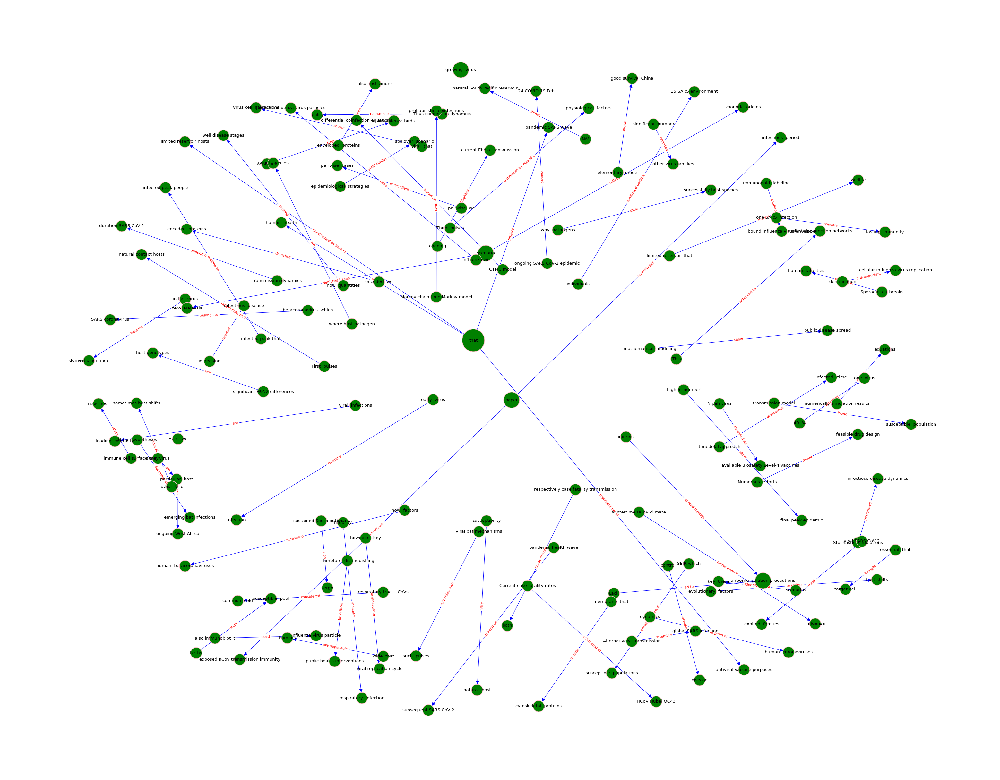

In [ ]:
sentence= "Transmission dynamics of the virus"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out16.csv', index=False) 

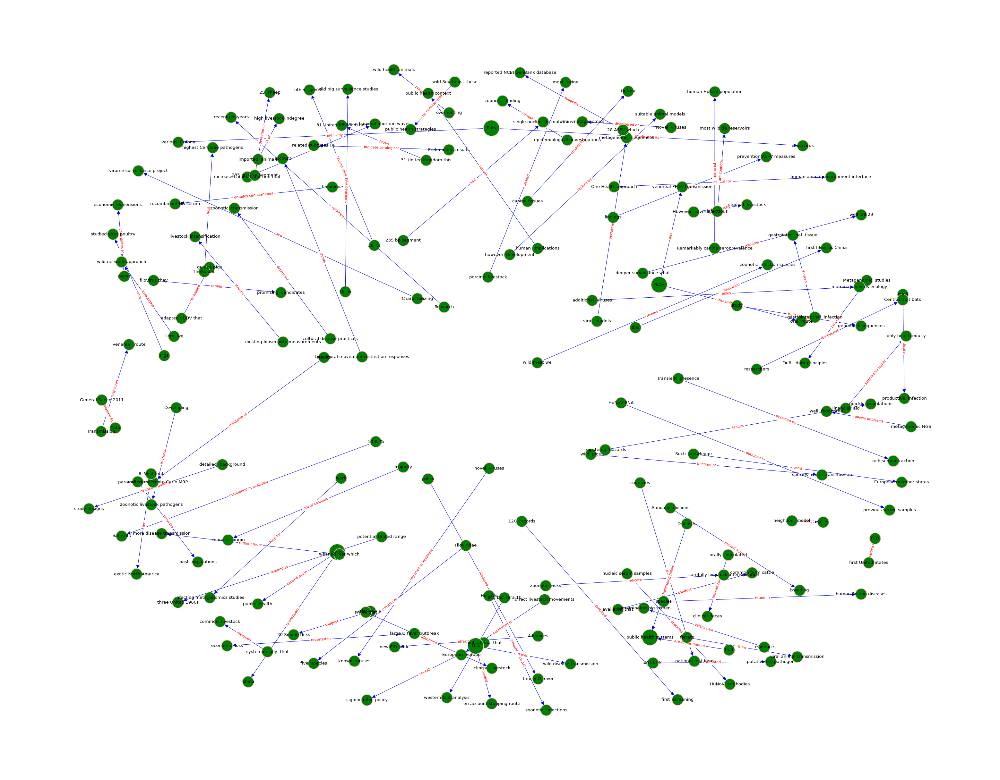

In [ ]:
sentence= "Evidence that livestock could be infected"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out17.csv', index=False) 

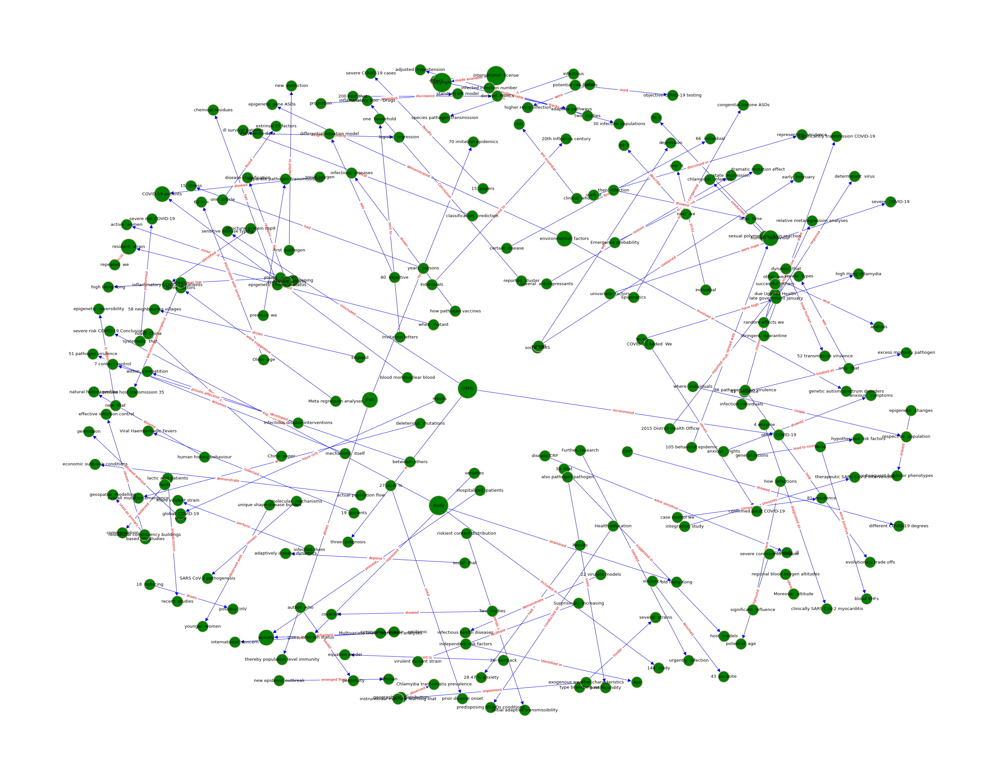

In [ ]:
sentence= "Socioeconomic and behavioral risk factors for this spill-over"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out18.csv', index=False) 

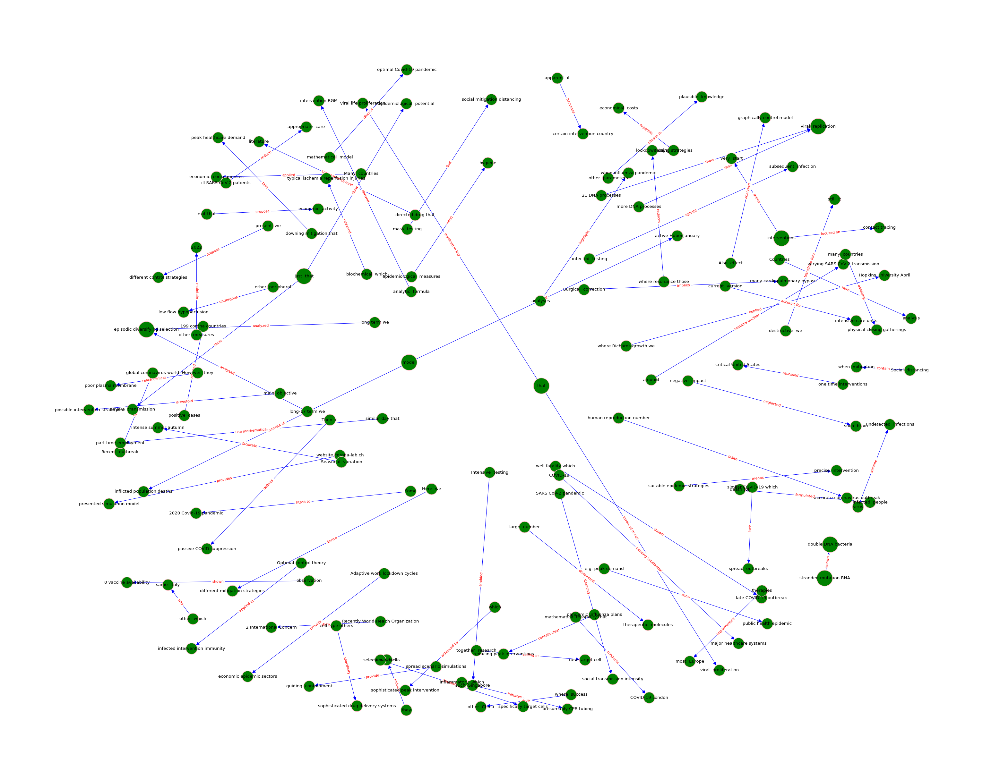

In [ ]:
sentence= "Sustainable risk reduction strategies"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out19.csv', index=False) 

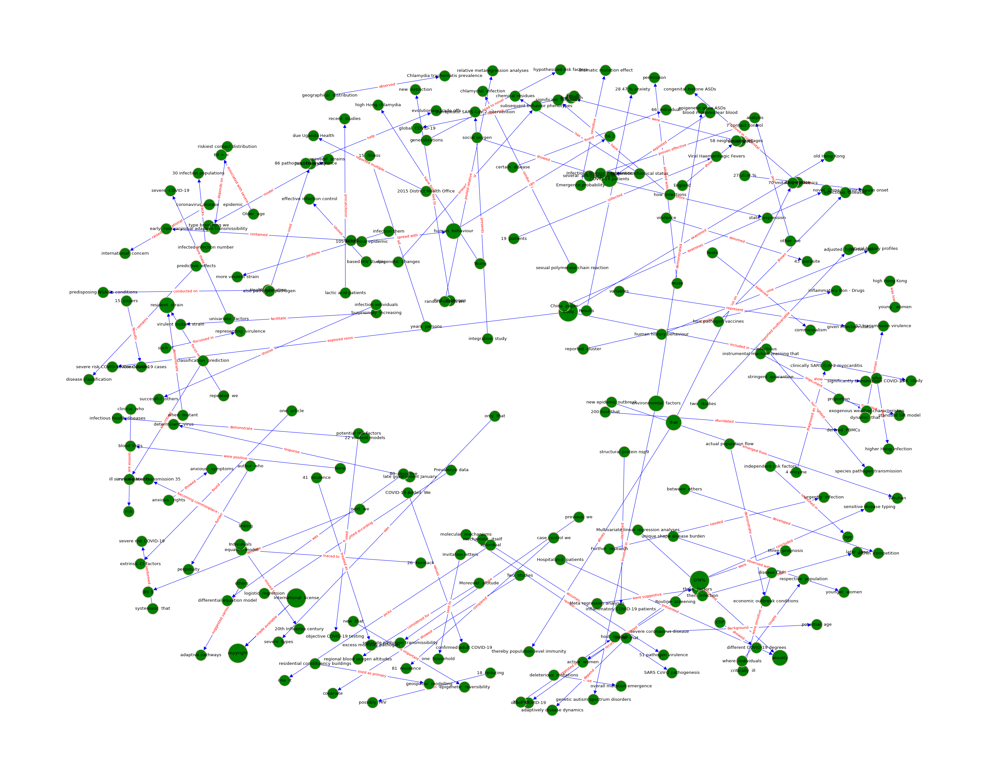

In [ ]:
sentence= "Socioeconomic and behavioral risk factors for this spill-over"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out20.csv', index=False) 

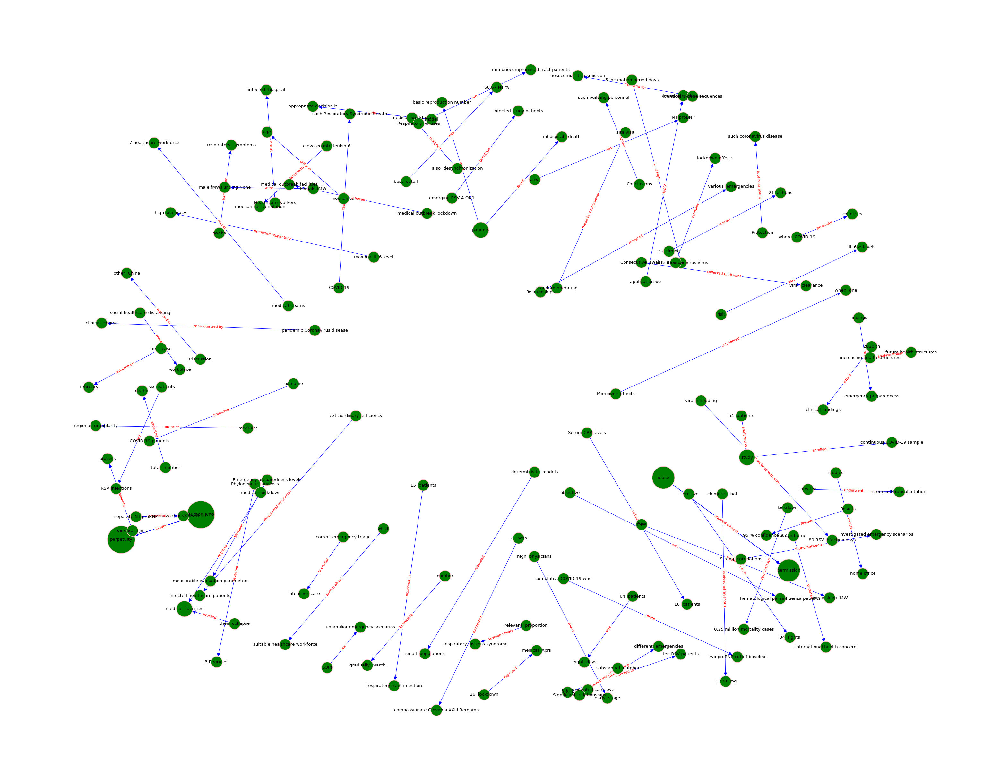

In [ ]:
sentence= "Mobilization of surge medical staff to address shortages"
similar=get_top_similar(sentence,sentence_list,similarity_matrix,15)

ind,title=list(map(list,zip(*similar)))
titles=[]
texts=[]
for i in ind:
    titles.append(all_articles.iloc[i]['title'])
    texts.append(all_articles.iloc[i]['abstract'])

texts=list(map(clean,texts))
text_list=' '.join(texts)

df = prepare_df(text_list)
draw_kg(df,c1='blue',c2='pink',c3='green')
df.to_csv(path + '/input/out21.csv', index=False) 